# Date - 17/10/2023
# Team ID - 3872
# Project Title - Product Demand Prediction using ML

# Importing Dependencies

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error,mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Loading Dataset

In [3]:
dataset = pd.read_excel("F:\\PoductDemand.xlsx")

# Data Exploration

In [4]:
dataset

,ID,Store ID,Total Price,Base Price,Units Sold
0,1,8091,99.0375,111.8625,20
1,2,8091,99.0375,99.0375,28
2,3,8091,133.9500,133.9500,19
3,4,8091,133.9500,133.9500,44
4,5,8091,141.0750,141.0750,52
...,...,...,...,...,...
150145,212638,9984,235.8375,235.8375,38
150146,212639,9984,235.8375,235.8375,30
150147,212642,9984,357.6750,483.7875,31
150148,212643,9984,141.7875,191.6625,12


In [5]:
dataset.columns

Index(['ID', 'Store ID', 'Total Price', 'Base Price', 'Units Sold'], dtype='object')

In [6]:
dataset.describe()

,ID,Store ID,Total Price,Base Price,Units Sold
count,150150.000000,150150.000000,150149.000000,150150.000000,150150.000000
mean,106271.555504,9199.422511,206.626751,219.425927,51.674206
std,61386.037861,615.591445,103.308516,110.961712,60.207904
min,1.000000,8023.000000,41.325000,61.275000,1.000000
25%,53111.250000,8562.000000,130.387500,133.237500,20.000000
50%,106226.500000,9371.000000,198.075000,205.912500,35.000000
75%,159452.750000,9731.000000,233.700000,234.412500,62.000000
max,212644.000000,9984.000000,562.162500,562.162500,2876.000000


In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150150 entries, 0 to 150149
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   ID           150150 non-null  int64  
 1   Store ID     150150 non-null  int64  
 2   Total Price  150149 non-null  float64
 3   Base Price   150150 non-null  float64
 4   Units Sold   150150 non-null  int64  
dtypes: float64(2), int64(3)
memory usage: 5.7 MB


# Cleaning

In [8]:
dataset.isnull().sum()

ID             0
Store ID       0
Total Price    1
Base Price     0
Units Sold     0
dtype: int64

In [9]:
a=dataset['Total Price'].agg([np.mean])
a

mean    206.626751
Name: Total Price, dtype: float64

In [10]:
dataset.replace(np.NaN,206.626751,inplace=True)


In [11]:
dataset.isnull().sum()

ID             0
Store ID       0
Total Price    0
Base Price     0
Units Sold     0
dtype: int64

# Pre-Processing and Visualisation of Data

<AxesSubplot:xlabel='Base Price', ylabel='Count'>

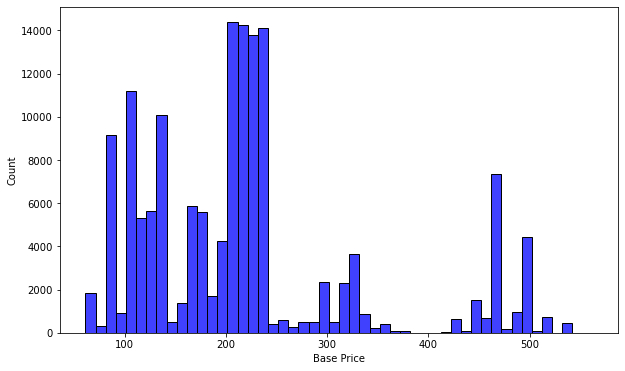

In [12]:
plt.figure(figsize=(10,6))
sns.histplot(dataset, x='Base Price', bins=50, color='blue')

<Figure size 792x504 with 0 Axes>

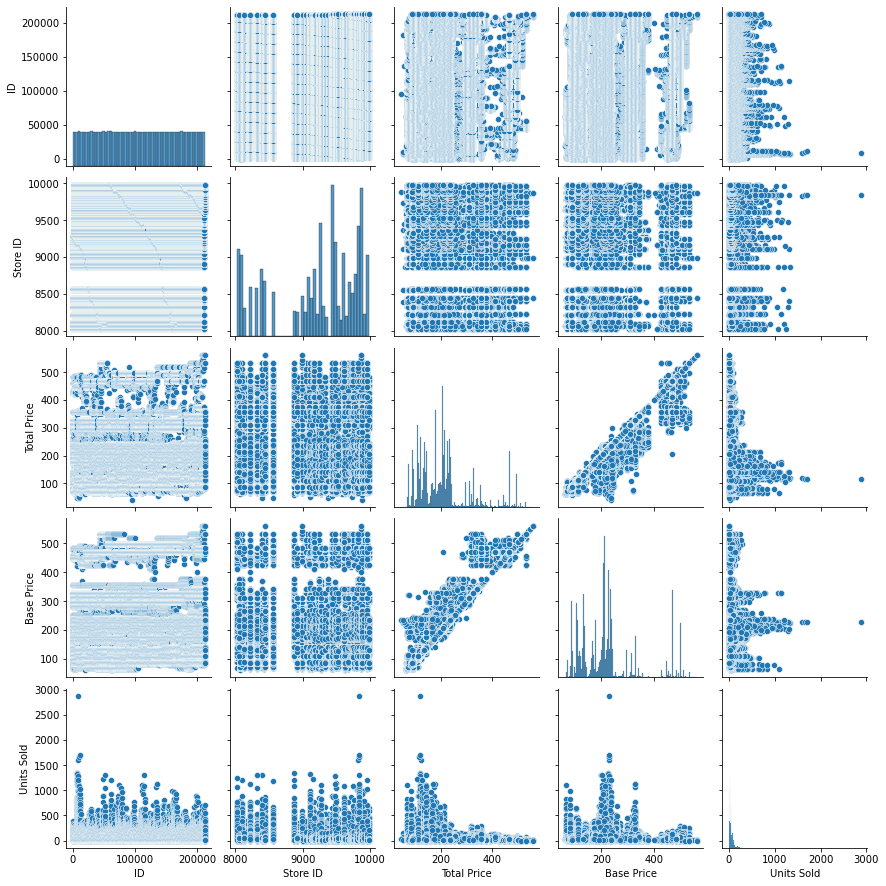

In [13]:
plt.figure(figsize=(11,7))
sns.pairplot(dataset)

In [21]:
fig=px.scatter(dataset,x="Units Sold",y="Total Price",size="Units Sold")
fig.show()

array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'Store ID'}>],
       [<AxesSubplot:title={'center':'Total Price'}>,
        <AxesSubplot:title={'center':'Base Price'}>],
       [<AxesSubplot:title={'center':'Units Sold'}>, <AxesSubplot:>]],
      dtype=object)

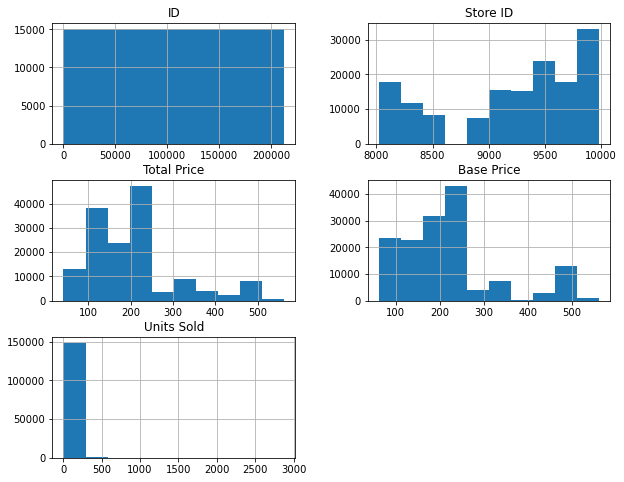

In [15]:
dataset.hist(figsize=(10,8))

<AxesSubplot:xlabel='Store ID', ylabel='count'>

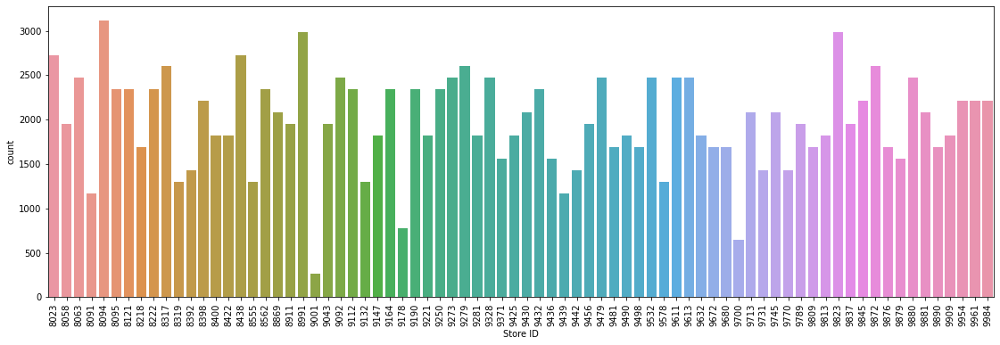

In [16]:
plt.figure(figsize=(19,6))
plt.xticks(rotation=90)
sns.countplot(x = 'Store ID', data = dataset)

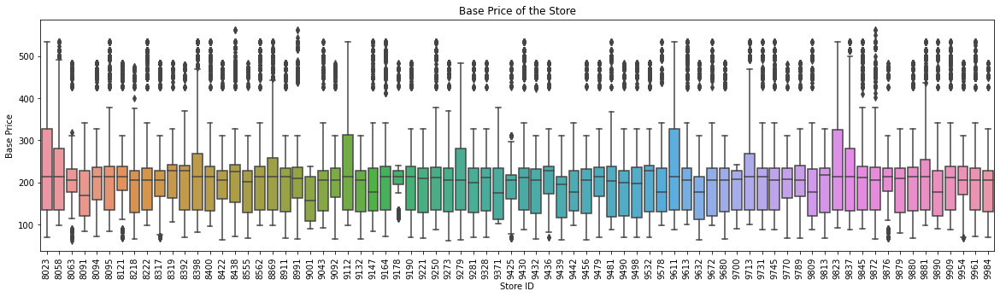

In [17]:
fig, ax = plt.subplots(figsize=(20, 5))
plt.xticks(rotation=90)
sns.boxplot(data=dataset, x='Store ID', y='Base Price')
ax.set_title('Base Price of the Store')
plt.show()


In [18]:
a1 = dataset.groupby('Total Price')['Units Sold'].sum()
a1

Total Price
41.3250       24
48.4500       95
49.1625      236
52.7250       18
57.0000       91
            ... 
528.6750      31
533.6625    5213
542.9250       4
550.0500      10
562.1625      43
Name: Units Sold, Length: 647, dtype: int64

In [19]:
plt.figure(figsize=(250,76))
plt.xticks(rotation=90)
a1.plot(kind = 'bar', ylabel = 'Sum of the demand' )

<AxesSubplot:xlabel='Total Price', ylabel='Sum of the demand'>

# Visualising Correlation

<AxesSubplot:>

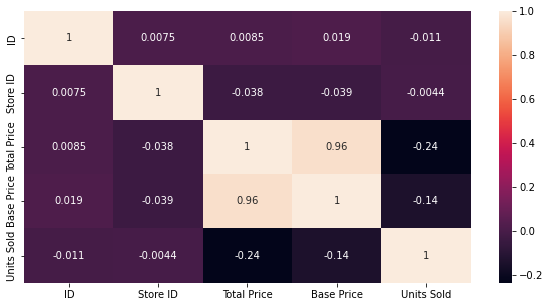

In [20]:
plt.figure(figsize=(10,5))
sns.heatmap(dataset.corr(), annot=True)